# UMAPs, growth rates and pulls of E8.0 --> E.25

In [2]:
import numpy as np
import anndata
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

#sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(11,6)})

import mplscience

mplscience.set_style(reset_current=True)
plt.rcParams['figure.dpi'] = 200

In [3]:
Path="/home/mgander/Unrelated/moscotTime_Reproducibility/Data"

# Define time points
t=[3.5, 4.5, 5.25, 5.5]+[6.25+x/4 for x in range(0,10)]+[8.5]+[9.5+x for x in range(0,5)]
ts=[str(a) for a in [3.5, 4.5, 5.25, 5.5, 6.25]] + [str(a) for a in np.arange(6.5, 8.5, 0.25)] + ['8.5a', '8.5b']+ [str(a) for a in np.arange(9.5, 14.5, 1)]
ts=['E'+a for a in ts]


t2=[3.5, 4.5, 5.25, 5.5]+[6.25+x/4 for x in range(0,10)]+[9.5+x for x in range(0,5)]

# Growth of embryo:
#    - cells corresponds to the estimated total amount of cells in the embryo for each time point
#    - av_g corresponds to the average grwoth rate of the embryo at each specific time point
cells=[32, 80, 100, 120, 400, 660, 1720, 4500, 8200, 15000, 30000, 60000, 73000, 90000, 200000, 1100000, 2600000, 6000000, 13000000 ]
av_g=np.zeros(len(t2)-1)
for i in range(0,len(av_g)):
    av_g[i]=cells[i+1]/cells[i]/(t2[i+1]-t2[i])

# Load anndatas and maps

In [4]:
def load_growth_rates(ts0, ts1):
    adata=sc.read(f"{Path}/anndatas/Comb_anndatas/adata_{ts0}_{ts1}.h5ad")
    grM=np.load(f'{Path}/moscot_maps/{ts0}_growth_rates.npy')
    grT=np.load(f'{Path}/TOME_transport_maps/{ts0}_growth_rates.npy')
    A0=adata[adata.obs['day']==min(set(adata.obs['day']))].copy()
    A0.obs['growth_rate_moscot']=grM
    A0.obs['growth_rate_clTOME']=grT
    A0.obs['Cell type']=A0.obs['cell_type']
    return(A0.obs)

In [5]:
i=11

ts0=ts[i]
print(ts0)
ts1=ts[i+1]

E8.0


In [ ]:
adata=sc.read(f"{Path}/anndatas/Comb_anndatas/adata_{ts0}_{ts1}.h5ad")

Only considering the two last: ['.25', '.h5ad'].
Only considering the two last: ['.25', '.h5ad'].


In [ ]:
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pcaS')

In [ ]:
sc.tl.umap(adata, random_state=52)

U0=adata.obsm['X_umap'][:,0].copy()
U1=adata.obsm['X_umap'][:,1].copy()
adata.obsm['X_umap'][:,0]=U1
adata.obsm['X_umap'][:,1]=-U0

In [ ]:
#rs 1
sc.pl.umap(adata, color='cell_type', size=10)

In [ ]:
# Add growth rates and pull to A0
A0=adata[adata.obs['day']==8].copy()

A0.obs['gr_init']=np.load(f'{Path}/moscot_maps/{ts0}_init_growth_rates.npy')
A0.obs['gr_m2']=np.load(f'{Path}/moscot_maps/{ts0}_growth_rates.npy')
A0.obs['gr_m']=np.load(f'{Path}/moscot_maps/{ts0}_growth_rates_no_gr_init.npy')
A0.obs['gr_t']=np.load(f'{Path}/TOME_transport_maps/{ts0}_growth_rates.npy')

ct='E8.25:First heart field'
A0.obs['fhf_m']=np.load(f"{Path}/moscot_maps/{ts0}_{ct}_pull.npy", allow_pickle=True)
A0.obs['fhf_t']=np.load(f"{Path}/TOME_transport_maps/{ts0}_{ct}_pull.npy", allow_pickle=True)

# Plot growth rates

In [ ]:
# Only k biggest cell types
cts=list(A0.obs.value_counts('cell_type').index)[:5]
A0s=A0[A0.obs['cell_type'].isin(cts)].copy()

In [57]:
A0.obs.value_counts('cell_type')/len(A0)

cell_type
Primitive erythroid cells           0.108567
Rostral neuroectoderm               0.103711
Extraembryonic visceral endoderm    0.069660
Paraxial mesoderm B                 0.066902
Caudal lateral epiblast             0.066603
Paraxial mesoderm A                 0.059409
Blood progenitors                   0.059109
Extraembryonic ectoderm             0.057551
Amniochorionic mesoderm             0.055332
Splanchnic mesoderm                 0.053354
Extraembryonic mesoderm             0.053174
Surface ectoderm                    0.041185
Hematoendothelial progenitors       0.036329
Caudal neuroectoderm                0.033271
Paraxial mesoderm C                 0.027157
Allantois                           0.026317
Gut                                 0.023919
Endothelium                         0.010071
Notochord                           0.009472
Spinal cord                         0.008992
Intermediate mesoderm               0.007254
Somatic mesoderm                    0.006115


<Figure size 2000x1600 with 0 Axes>

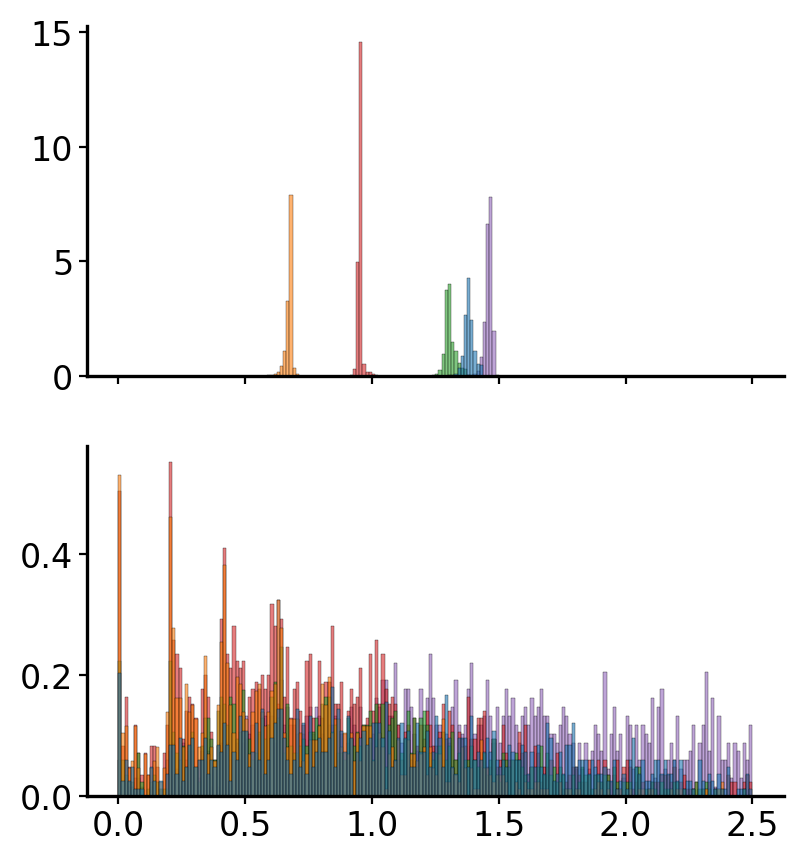

In [54]:
alpha=0.6

ns=201

plt.figure(figsize = [10, 8], dpi=200)

fig, axs = plt.subplots(2, 1, figsize=(4.5, 5))

g0=sns.histplot(ax=axs[0], data=A0s.obs, x='gr_m', hue='cell_type', bins=np.linspace(0,2.5,ns), 
             alpha=0.6, legend=False, stat='density')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g1=sns.histplot(ax=axs[1], data=A0s.obs, x='gr_t', hue='cell_type', bins=np.linspace(0,2.5,ns), 
             alpha=0.6, legend=False, stat='density')
g1.set(xlabel=None)
g1.set(ylabel=None)
plt.show()

<Figure size 2000x1600 with 0 Axes>

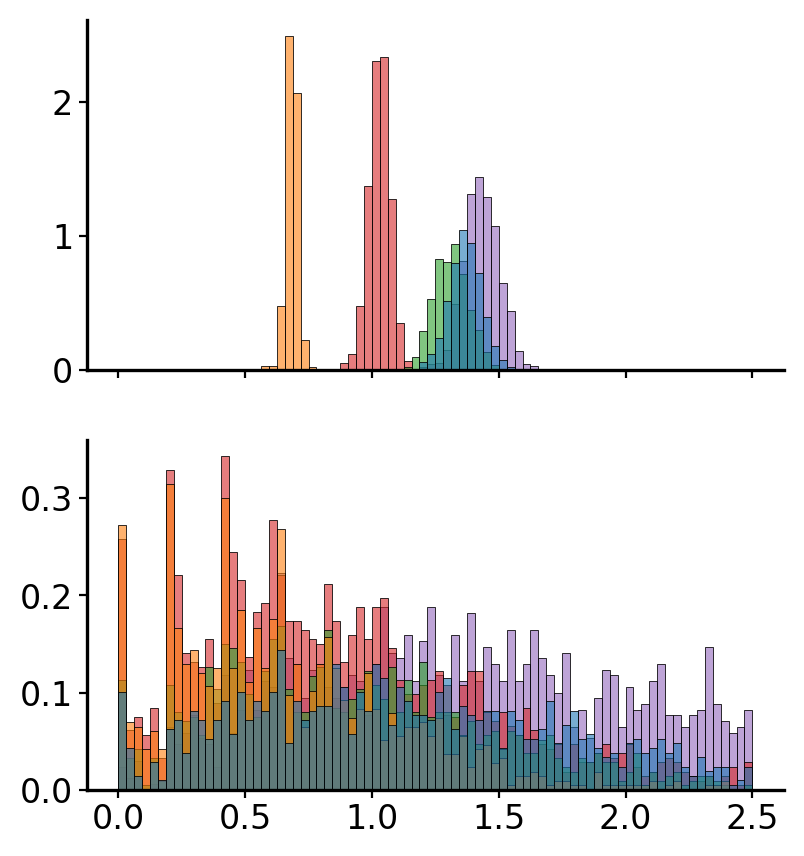

In [22]:
alpha=0.6

ns=81

plt.figure(figsize = [10, 8], dpi=200)

fig, axs = plt.subplots(2, 1, figsize=(4.5, 5))

g0=sns.histplot(ax=axs[0], data=A0s.obs, x='gr_m2', hue='cell_type', bins=np.linspace(0,2.5,ns), 
             alpha=0.6, legend=False, stat='density')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g1=sns.histplot(ax=axs[1], data=A0s.obs, x='gr_t', hue='cell_type', bins=np.linspace(0,2.5,ns), 
             alpha=0.6, legend=False, stat='density')
g1.set(xlabel=None)
g1.set(ylabel=None)
plt.show()

In [23]:
i=11
ts0=ts[i]
ts1=ts[i+1]
print(f'{ts0}_{ts1}')
print('------------------------')

adata=sc.read(f"{Path}/anndatas/Comb_anndatas/adata_{ts0}_{ts1}.h5ad")

E8.0_E8.25
------------------------
Only considering the two last: ['.25', '.h5ad'].
Only considering the two last: ['.25', '.h5ad'].


In [28]:
adata[~adata.obs['cell_type'].isin(['Extraembryonic ectoderm',
                                    'Extraembryonic mesoderm','Extraembryonic visceral endoderm'])]

View of AnnData object with n_obs × n_vars = 27709 × 29452
    obs: 'cellID', 'day', 'cell_state', 'cell_type', 'group', 'sample', 'origin'
    var: 'features', 'gene_names'
    obsm: 'X_pcaS', 'X_umap3'

In [29]:
adata

AnnData object with n_obs × n_vars = 32616 × 29452
    obs: 'cellID', 'day', 'cell_state', 'cell_type', 'group', 'sample', 'origin'
    var: 'features', 'gene_names'
    obsm: 'X_pcaS', 'X_umap3'

In [25]:
set(adata.obs['cell_type'])

{'Allantois',
 'Amniochorionic mesoderm',
 'Amniochorionic mesoderm A',
 'Amniochorionic mesoderm B',
 'Blood progenitors',
 'Caudal lateral epiblast',
 'Caudal neuroectoderm',
 'Definitive endoderm',
 'Embryonic visceral endoderm',
 'Endothelium',
 'Extraembryonic ectoderm',
 'Extraembryonic mesoderm',
 'Extraembryonic visceral endoderm',
 'First heart field',
 'Forebrain/midbrain',
 'Gut',
 'Hematoendothelial progenitors',
 'Hindbrain',
 'Intermediate mesoderm',
 'Neural crest',
 'Neuromesodermal progenitors',
 'Notochord',
 'Paraxial mesoderm A',
 'Paraxial mesoderm B',
 'Paraxial mesoderm C',
 'Parietal endoderm',
 'Primitive erythroid cells',
 'Primordial germ cells',
 'Rostral neuroectoderm',
 'Second heart field',
 'Somatic mesoderm',
 'Spinal cord',
 'Splanchnic mesoderm',
 'Surface ectoderm'}

In [ ]:
'Embryonic visceral endoderm'

In [ ]:
'Embryonic visceral endoderm'
'Extraembryonic ectoderm',
'Extraembryonic mesoderm',
'Extraembryonic visceral endoderm'

In [ ]:
Embryonic visceral endoderm
Extraembryonic visceral endoderm
Visceral endoderm
Parietal endoderm
Hypoblast
Inner cell mass
Morula
Trophectoderm
Extraembryonic ectoderm

In [ ]:
adata.obs

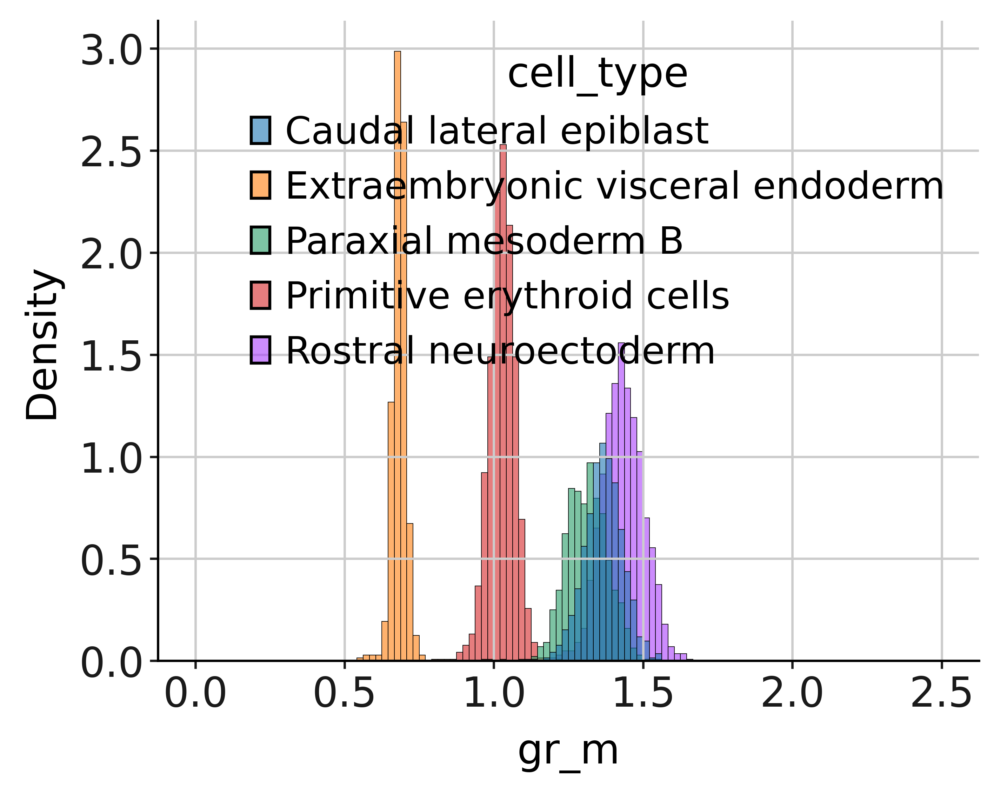

In [74]:
sns.histplot(data=A0s.obs, x='gr_m', hue='cell_type', bins=np.linspace(0,2.5,121), 
             alpha=0.6, legend=True, stat='density')
plt.show()

In [24]:
A0s.obs

,cellID,day,cell_state,cell_type,group,sample,origin,gr_init,gr_m,gr_t,fhf_m,fhf_t
cell_30639,cell_30639,8.0,E8:Caudal lateral epiblast,Caudal lateral epiblast,2,cell_30639,Pijuan,NaN,1.381373,0.815078,4.278143e-09,0.0
cell_30643,cell_30643,8.0,E8:Primitive erythroid cells,Primitive erythroid cells,2,cell_30643,Pijuan,NaN,0.975215,0.532503,4.524095e-17,0.0
cell_30648,cell_30648,8.0,E8:Primitive erythroid cells,Primitive erythroid cells,2,cell_30648,Pijuan,NaN,0.977619,1.707956,1.548826e-21,0.0
cell_30649,cell_30649,8.0,E8:Extraembryonic visceral endoderm,Extraembryonic visceral endoderm,2,cell_30649,Pijuan,NaN,0.660060,1.282267,0.000000e+00,0.0
cell_30652,cell_30652,8.0,E8:Caudal lateral epiblast,Caudal lateral epiblast,2,cell_30652,Pijuan,NaN,1.373619,2.397114,4.334147e-10,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
cell_130393,cell_130393,8.0,E8:Rostral neuroectoderm,Rostral neuroectoderm,3,cell_130393,Pijuan,NaN,1.440119,1.028972,1.317297e-22,0.0
cell_130395,cell_130395,8.0,E8:Rostral neuroectoderm,Rostral neuroectoderm,3,cell_130395,Pijuan,NaN,1.450236,3.555440,1.497346e-23,0.0
cell_130401,cell_130401,8.0,E8:Paraxial mesoderm B,Paraxial mesoderm B,3,cell_130401,Pijuan,NaN,1.299957,0.897680,7.754636e-10,0.0
cell_130404,cell_130404,8.0,E8:Paraxial mesoderm B,Paraxial mesoderm B,3,cell_130404,Pijuan,NaN,1.321435,0.136289,3.044231e-27,0.0


<Figure size 2000x1600 with 0 Axes>

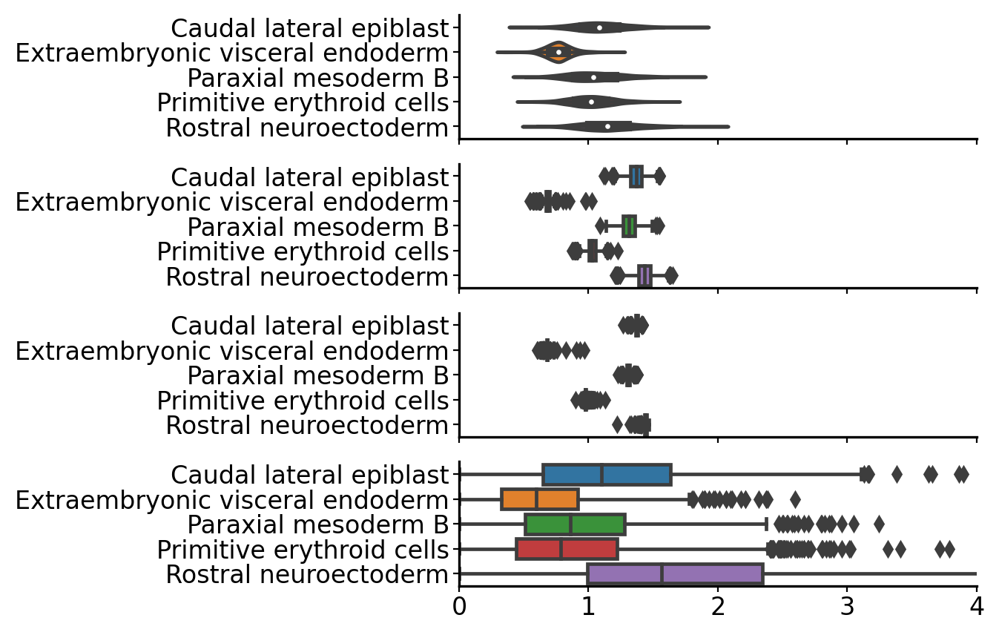

In [17]:
plt.figure(figsize = [10, 8], dpi=200)

xlim=4

fig, axs = plt.subplots(4, 1, figsize=(4.5, 5))

g0=sns.boxplot(ax=axs[0], data=A0s.obs, x='gr_init', y='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)


g0=sns.boxplot(ax=axs[1], data=A0s.obs, x='gr_m2', y='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g0=sns.boxplot(ax=axs[2], data=A0s.obs, x='gr_m', y='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g1=sns.boxplot(ax=axs[3], data=A0s.obs, x='gr_t', y='cell_type')
g1.set(xlabel=None)
g1.set(ylabel=None)


axs[0].set_xlim(0, xlim)
axs[1].set_xlim(0, xlim)
axs[2].set_xlim(0, xlim)
axs[3].set_xlim(0, xlim)

plt.show()

In [31]:
# Only k biggest cell types
cts=list(A0.obs.value_counts('cell_type').index)[:10]
A0s=A0[A0.obs['cell_type'].isin(cts)].copy()

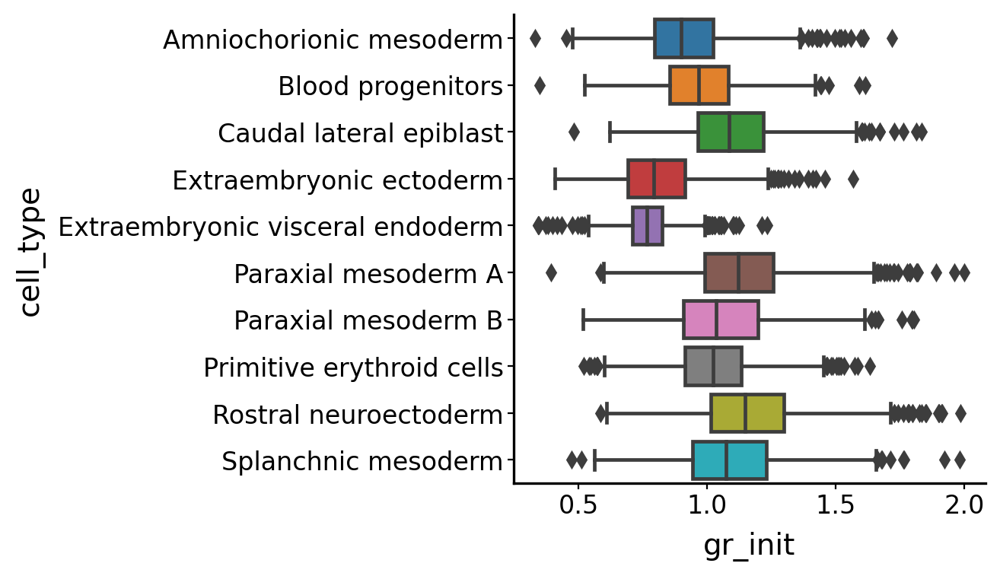

In [34]:
g1=sns.boxplot(data=A0s.obs, x='gr_init', y='cell_type')

<Figure size 2000x1600 with 0 Axes>

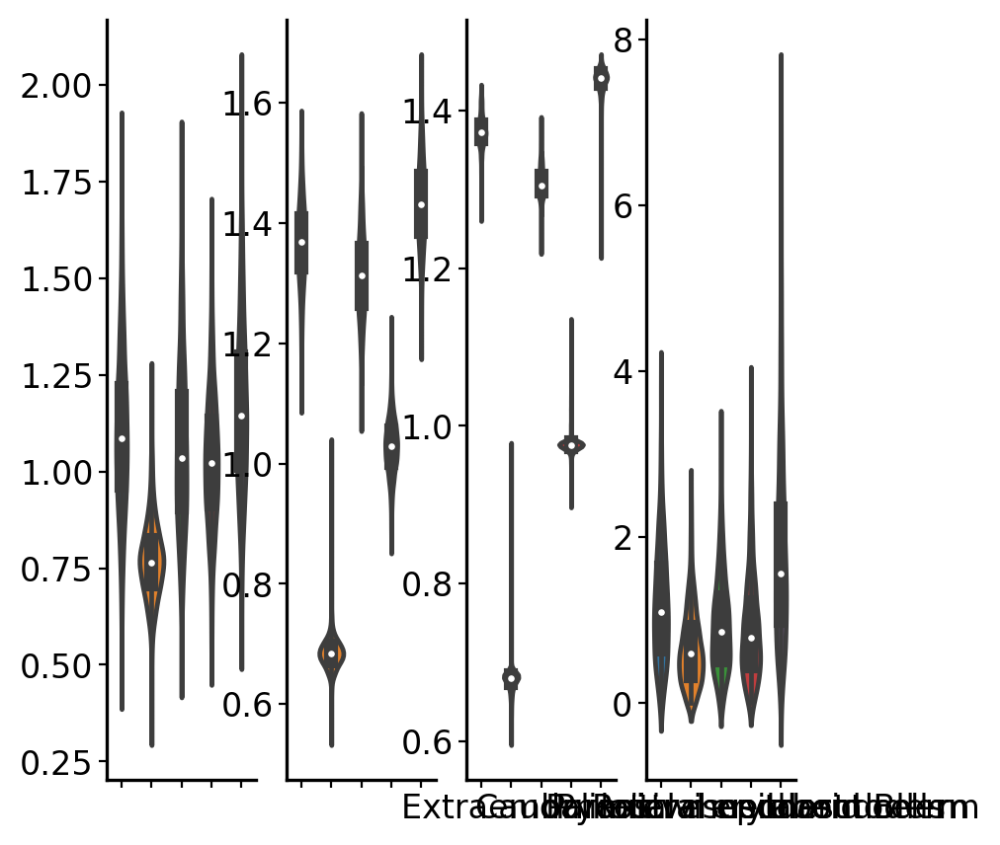

In [20]:
plt.figure(figsize = [10, 8], dpi=200)

xlim=4

fig, axs = plt.subplots(1, 4, figsize=(4.5, 5))

g0=sns.violinplot(ax=axs[0], data=A0s.obs, y='gr_init', x='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)


g0=sns.violinplot(ax=axs[1], data=A0s.obs, y='gr_m2', x='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g0=sns.violinplot(ax=axs[2], data=A0s.obs, y='gr_m', x='cell_type')
g0.set(xlabel=None)
g0.set(xticklabels=[])
g0.set(ylabel=None)

g1=sns.violinplot(ax=axs[3], data=A0s.obs, y='gr_t', x='cell_type')
g1.set(xlabel=None)
g1.set(ylabel=None)


#axs[0].set_xlim(0, xlim)
#axs[1].set_xlim(0, xlim)
#axs[2].set_xlim(0, xlim)
#axs[3].set_xlim(0, xlim)

plt.show()

# Visualize UMAPs

In [30]:
palette=[(128,198,128),
(125,135,185),
(142,6,59),
(120,173,210),
(28,230,255),
(190,193,212),
(74,111,227),
(247,156,212),
(181,187,227),
(230,175,185),
(255,178,110),
(211,63,106),
(51,102,0),
(17,198,56),
(141,213,147),
(198,222,199),
(234,211,198),
(133,149,225),
(214,188,192),
(15,207,192),
(230,125,126),
(156,222,214),
(190,164,215),
(246,196,225),
(2,63,165),
(187,119,13),
(127,127,127),
(199,199,199)]

palette=[np.array(a)/255 for a in palette]

In [85]:
ctss=list(A0.obs.value_counts('cell_type').index)[:20]
ctss.append('First heart field')
ctss=sorted(ctss)
adatas=adata[(adata.obs['cell_type'].isin(ctss))|(adata.obs['day']==8.25)].copy()

/home/mgander/miniconda3/envs/mc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


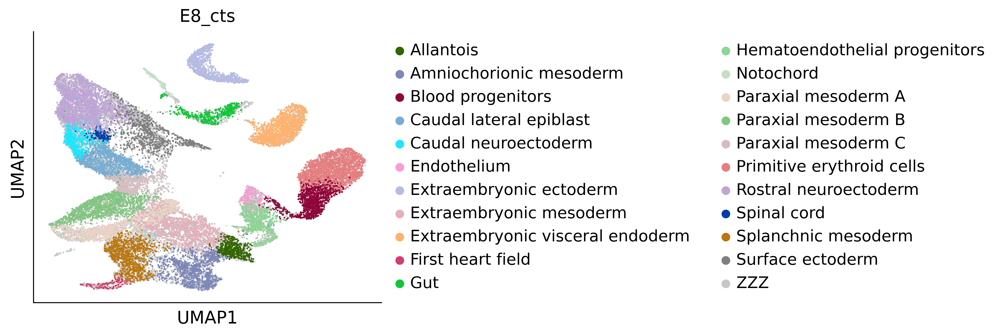

In [86]:
palette=[(51,102,0),
(125,135,185),
(142,6,59),
(120,173,210),
(28,230,255),
(247,156,212),
(181,187,227),
(230,175,185),
(255,178,110),
(211,63,106),
(17,198,56),
(141,213,147),
(198,222,199),
(234,211,198),
(128,198,128),
(214,188,192),
(230,125,126),
(190,164,215),
(2,63,165),
(187,119,13),
(127,127,127),
(199,199,199)]

palette=[np.array(a)/255 for a in palette]

# Resort to put E8.25 to the back

adatas.obs['E8_cts']=[a[3:] if a[:3]!='E8.' else 'ZZZ' for a in adatas.obs['cell_state']]
a0i=adatas[adatas.obs['day']==8].obs.index
a1i=adatas[adatas.obs['day']==8.25].obs.index
adatas=adatas[[*a1i, *a0i],:].copy()
sc.pl.umap(adatas, color='E8_cts', size=8, palette=palette)

/home/mgander/miniconda3/envs/mc/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


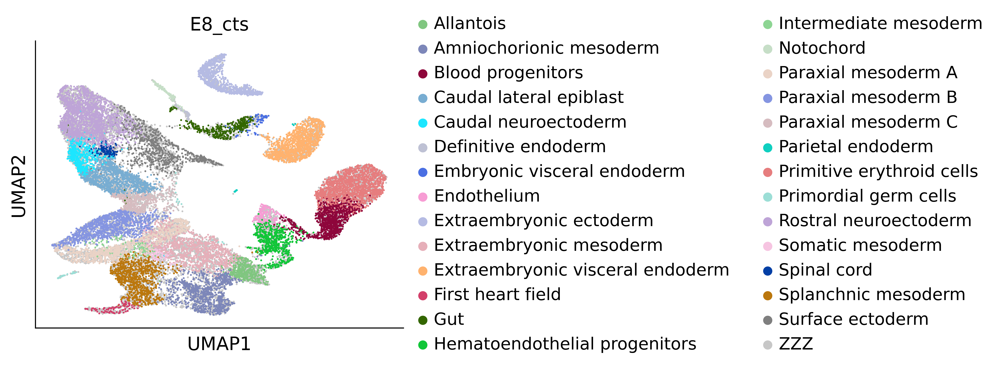

In [52]:
# Resort to put E8.25 to the back

adata.obs['E8_cts']=[a[3:] if a[:3]!='E8.' else 'ZZZ' for a in adata.obs['cell_state']]
a0i=adata[adata.obs['day']==8].obs.index
a1i=adata[adata.obs['day']==8.25].obs.index
adata=adata[[*a1i, *a0i],:].copy()
sc.pl.umap(adata, color='E8_cts', size=8, palette=palette)

In [ ]:
sc.pl.umap(adata, color='E8_cts', size=8, palette=palette)

In [37]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=300, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

# The legend

In [77]:
cell_types=sorted(set(adatas.obs['E8_cts']))

selected_cell_types=cts

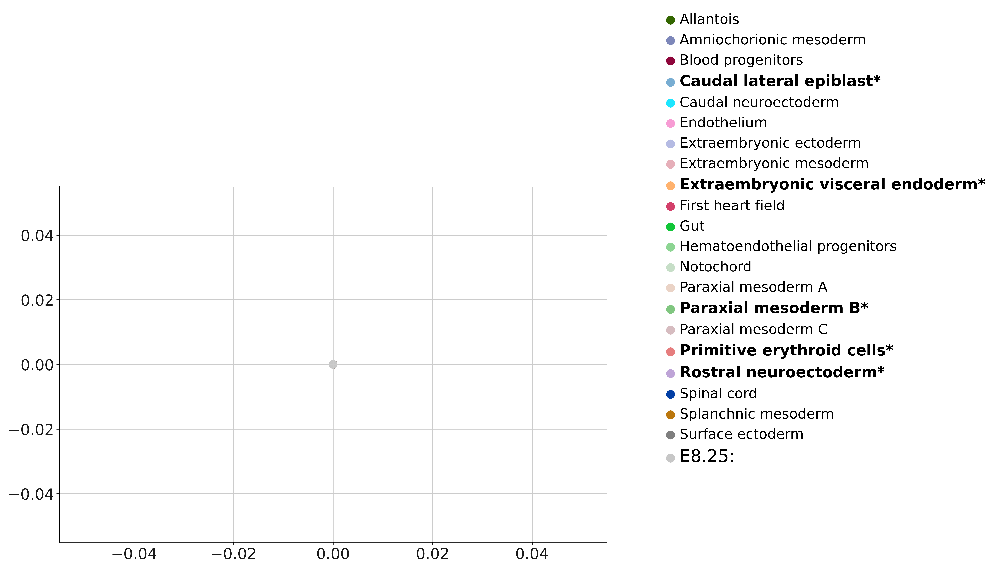

In [83]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=300)
for i in range(len(cell_types)):
    ct=cell_types[i]
    ax.scatter(0, 0, label=ct, s=50, color=palette[i], alpha=1)
    
legend = ax.legend(loc=(1.1,0.2))

# To make selected cell types bold
for text in legend.get_texts():
    cell_type=str(text).split(', ')[2][1:-2]
    if cell_type=='ZZZ':
        text.set_fontsize(16)
        text.set_text("E8.25:")
        
    if cell_type in selected_cell_types:
        text.set_text(cell_type+'*')
        text.set_fontweight("bold")
        text.set_fontsize(14)
        
#legend.legendHandles[11]._sizes = [300]

plt.show()

# Growth rate umaps

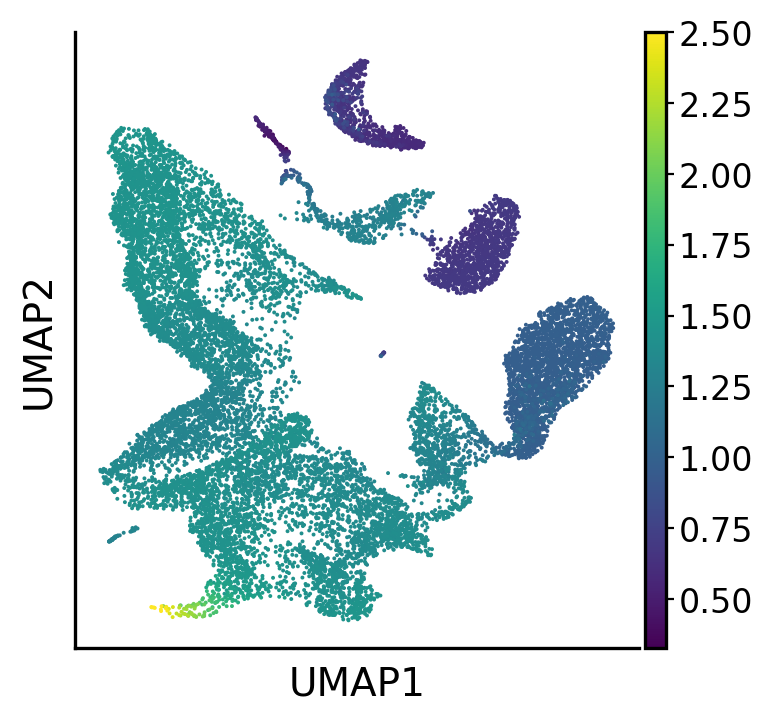

In [44]:
perc=99.9

sc.pl.umap(A0, color='gr_m', title='', vmax=2.5, size=8, legend_fontsize=10)

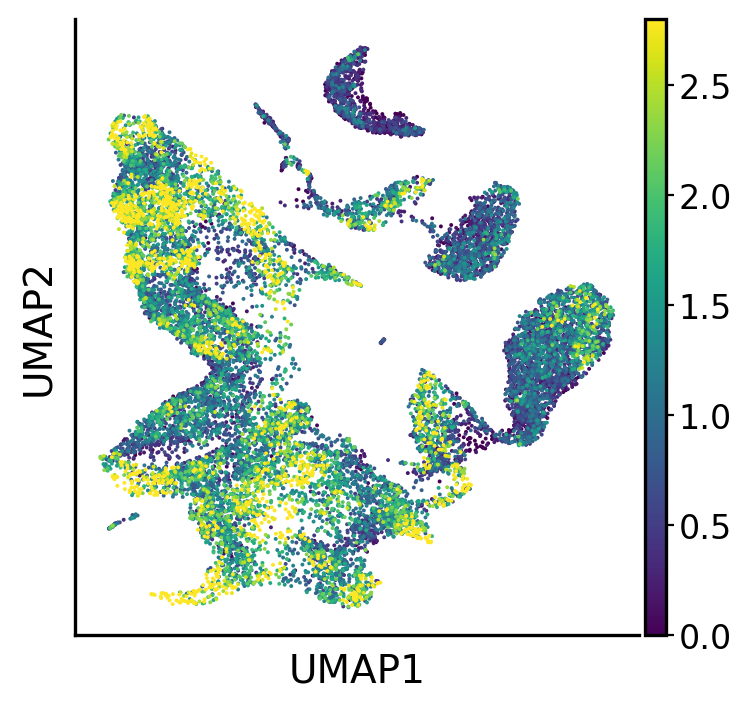

In [42]:
sc.pl.umap(A0, color='gr_t', title='', vmax=2.8, size=8, legend_fontsize=10)

# Pull Umaps

In [96]:
palette2=[(187,119,13),
(211,63,106),
(199,199,199)]
palette2=[np.array(a)/255 for a in palette2]

In [120]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=200, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

In [107]:
# Resort to put E8.25 to the back, and only color splanchnic mesoderm and first heart field

lst=[a if a in ['E8:Splanchnic mesoderm', 'E8.25:First heart field']  else 'Other cell types' for a in adata.obs['cell_state']]
lst=[a if a!='E8.25:First heart field' else 'E8.25: First \nheart field' for a in lst]
lst=[a if a!='E8:Splanchnic mesoderm' else 'E8.0: Splanchnic \nmesoderm' for a in lst]
adata.obs['FHF']=lst
a0i=adata[adata.obs['FHF']!='ZZZ'].obs.index
a1i=adata[adata.obs['FHF']=='ZZZ'].obs.index
adata=adata[[*a1i, *a0i],:]
sc.pl.umap(adata, color='FHF', size=5, palette=palette2)

/home/mgander/miniconda3/envs/mc/lib/python3.10/site-packages/anndata/_core/anndata.py:1222: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


KeyboardInterrupt: 

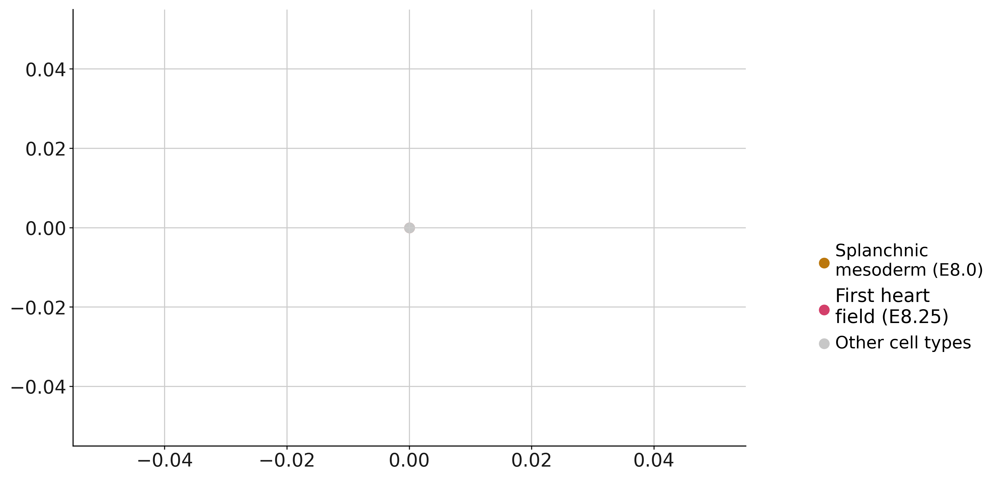

In [123]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)

ct_fhf=['Splanchnic \nmesoderm (E8.0)', 'First heart \nfield (E8.25)', 'Other cell types']
for i in range(3):
    ct=ct_fhf[i]
    ax.scatter(0, 0, label=ct, s=50, color=palette2[i], alpha=1)
    
legend = ax.legend(loc=(1.1,0.2))

# To make selected cell types bold
l=0
for text in legend.get_texts():
    cell_type=str(text).split(', ')[2][1:-2]
        
    if l==1:
        #text.set_fontweight("bold")
        text.set_fontsize(14)
    l+=1
        
#legend.legendHandles[11]._sizes = [300]

plt.show()

In [124]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=500, frameon=True, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

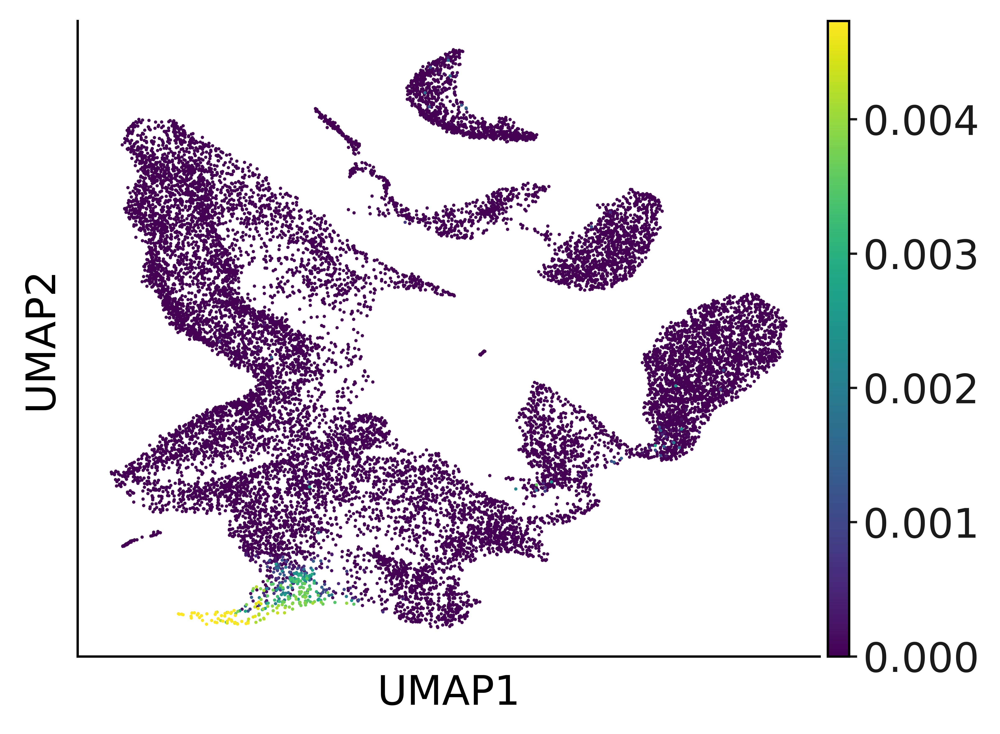

In [131]:
perc=99.8

vmax=np.sort(list(A0.obs['fhf_m']))[int(len(A0)*perc/100)]

sc.pl.umap(A0, color='fhf_m', title='', vmax=vmax, size=5, legend_fontsize=10)

# Umaps for gene correlation

In [67]:
A0S=sc.read(f"{Path}/anndatas/scVI_anndatas/scvi_adata_{ts0}.h5ad")
A0S.var.index=list(A0S.var['gene_names'])

In [68]:
A0S=A0S[A0.obs.index]

In [87]:
drivers=['Irx4', 'Tnnt2', 'Tbx20']

for d in drivers:
    loc=A0S.var.index.get_loc(d)
    
    A0.obs[d+'_pl']=list(A0S.layers['scvi_normalized'][:,loc])
A0.obs.columns=list(A0.obs.columns)

In [88]:
mplscience.set_style(reset_current=True)
sc.set_figure_params(scanpy=True, dpi=500, frameon=False, vector_friendly=True, fontsize=14, 
                     figsize=(5,4), color_map=None)

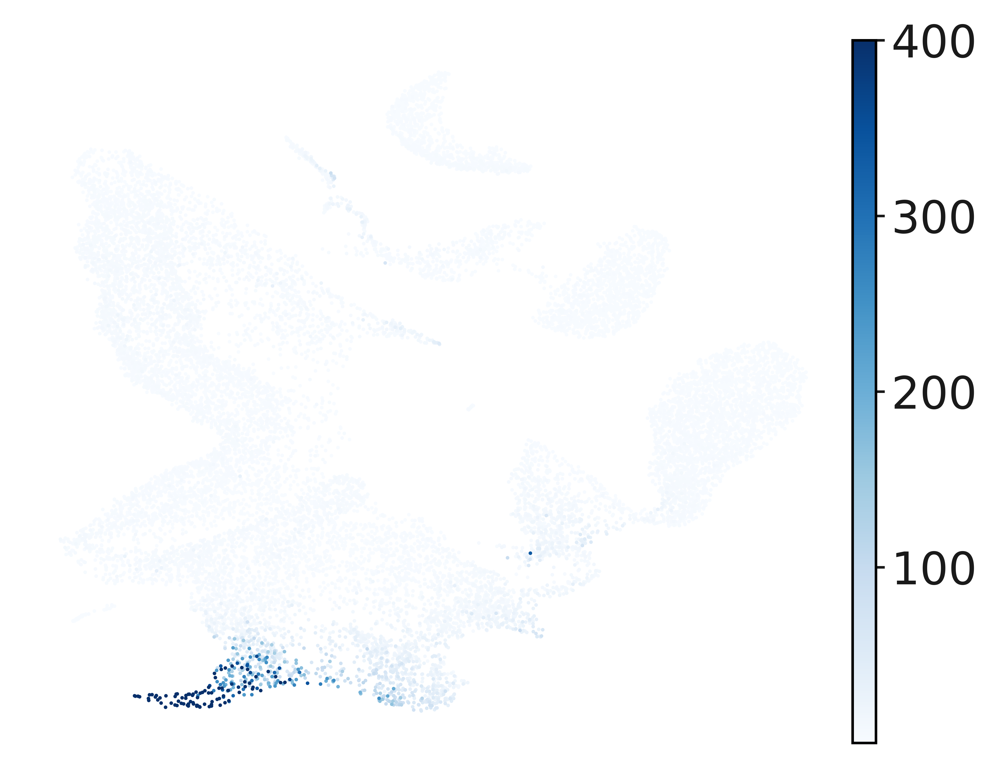

In [71]:
sc.pl.umap(A0, color='Tnnt2'+'_pl', title='', color_map='Blues', size=5, vmax=400, legend_loc=(0,0))

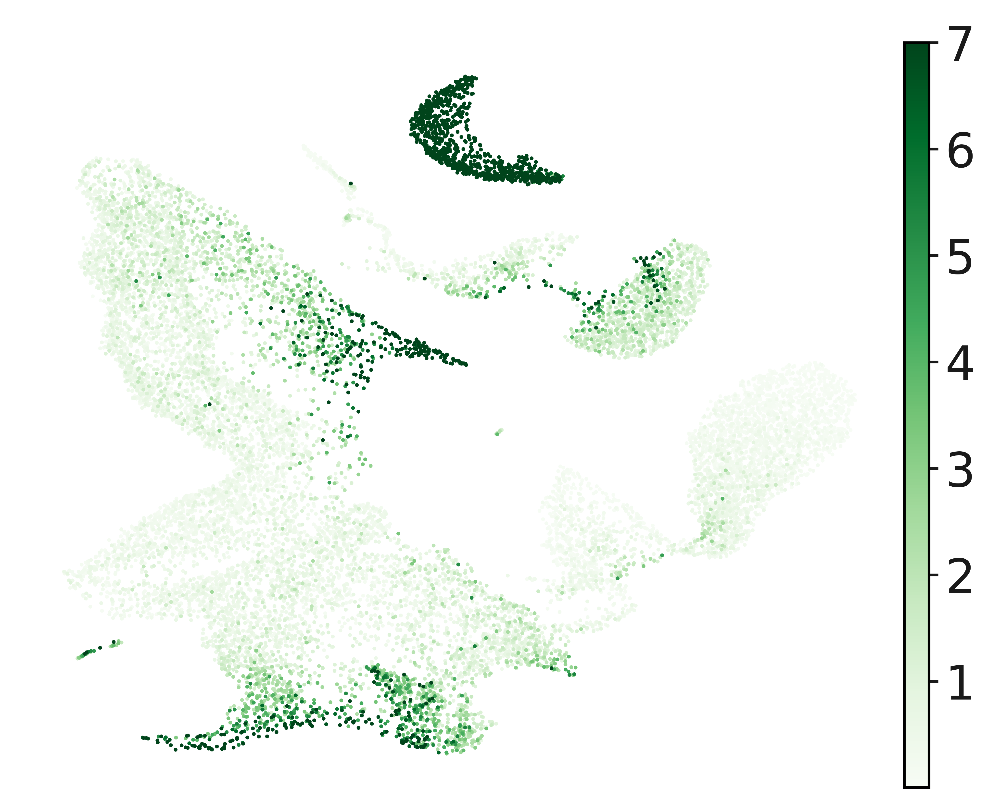

In [96]:
sc.pl.umap(A0, color='Irx4'+'_pl', title='', color_map='Greens', size=5, vmax=7, legend_loc=(0,0))

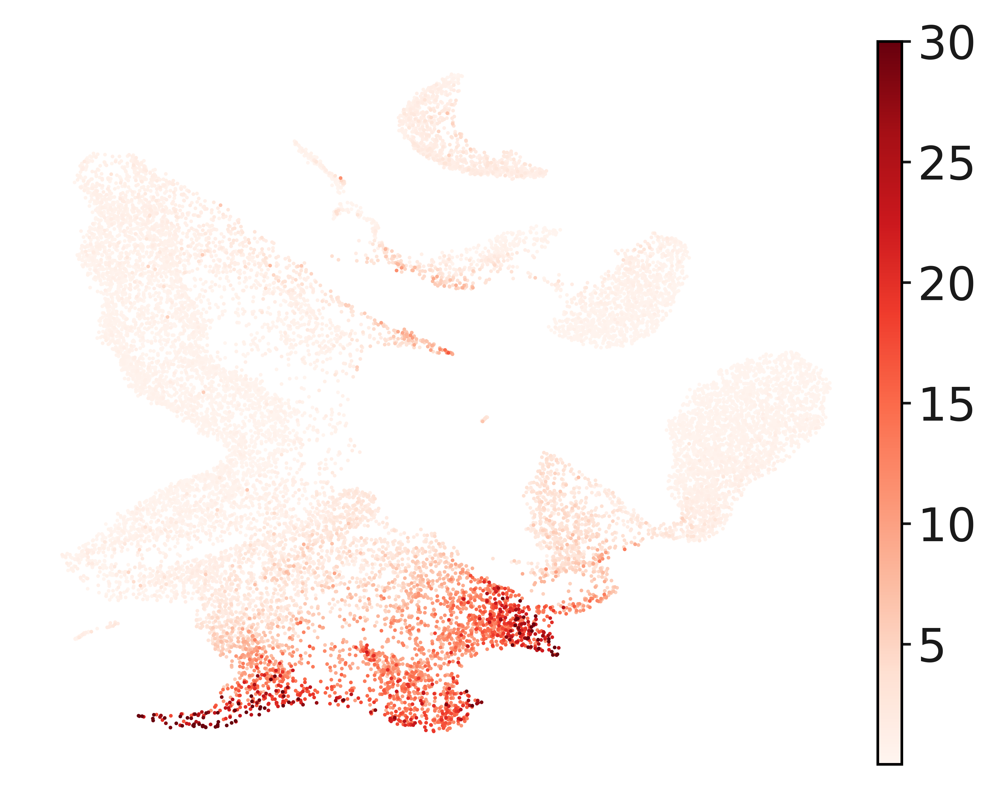

In [152]:
sc.pl.umap(A0, color='Tbx20'+'_pl', title='', color_map='Reds', size=5, vmax=30, legend_loc=(0,0))

In [83]:
def col_map(v):
    r,g,b=v
    cdict2 = {'red':   [(0.0,  0, 0),
                       (1.0,  r,0)],
             'green': [(0.0,  0, 0),
                      (1.0,  g, 0)],
             'blue':  [(0.0,  0, 0.0),
                      (1.0,  b, 0)]} 
    my_cmap = matplotlib.colors.LinearSegmentedColormap('my_colormap2',cdict2,256)
    return(my_cmap)

In [84]:
def plt_cmap(cmap):
    plt.figure()
    a=np.outer(np.arange(0,1,0.01),np.ones(100))
    plt.imshow(a,aspect='auto', cmap =cmap)                   
    plt.show()

In [93]:
def col_dict(genes, k=-2):
    if gene=='Tnnt2':
        col=sns.color_palette('Blues')[k]
    elif gene=='Cdkn1c':
        col=sns.color_palette('Blues')[k]
    elif gene=='Bmp2':
        col=sns.color_palette('Greens')[k]
    elif gene=='Irx4':
        col=sns.color_palette('Greens')[k]
    elif gene=='Tbx20':
        col=sns.color_palette('Reds')[k]
    return(col)

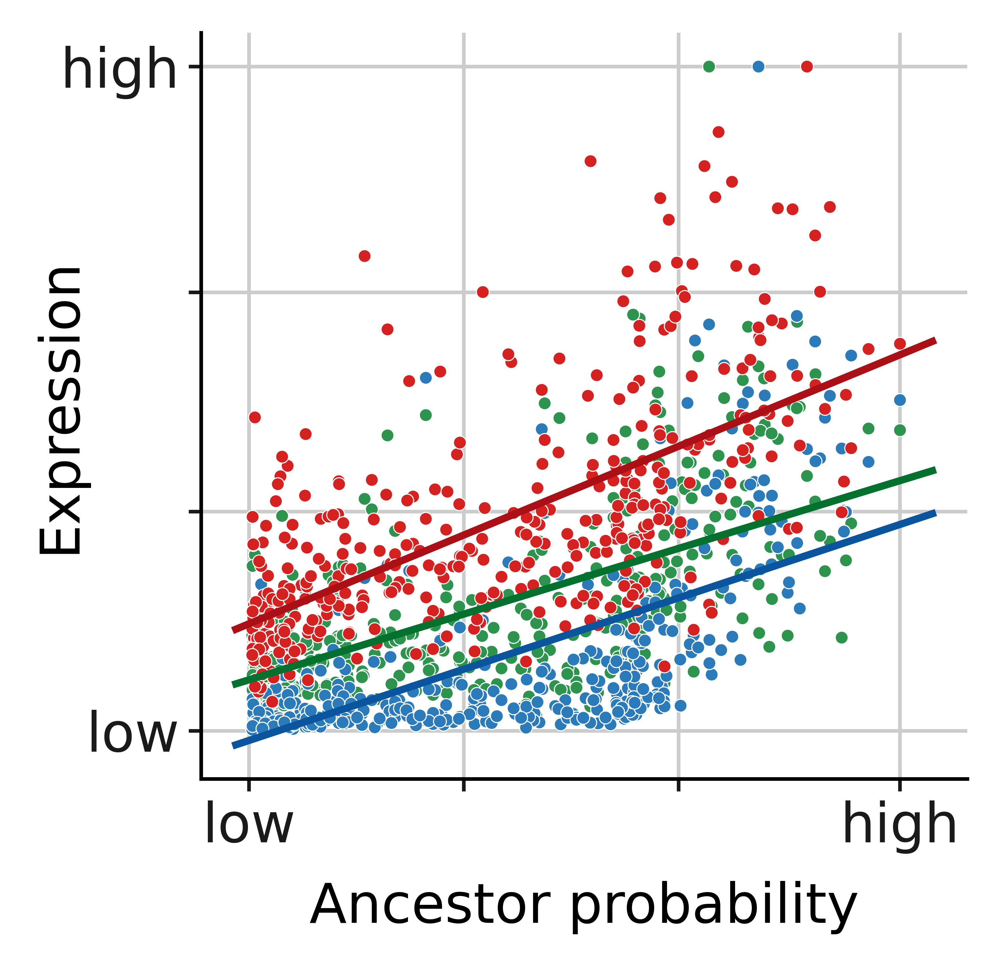

In [95]:
fontsize=12

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(3, 3))

#for gene in ['Tnnt2', 'Tbx20', 'Cdkn1c', 'Bmp2', 'Ccdc141']:
for gene in ['Irx4', 'Tnnt2', 'Tbx20']:

    ms=0.9
    cut=0.005
    
    loc=A0S.var.index.get_loc(gene)
    exp=A0S.layers['scvi_normalized'][:,loc]

    wh=np.where(A0S.obs['cell_state'].isin(['E8:Splanchnic mesoderm', 'E8:First heart field']))[0]
    exp=A0.obs[gene+'_pl'][wh]
    gM2=A0.obs['fhf_m'][wh]
    
    gM2=gM2/gM2.max()
    exp=exp/exp.max()
    
    wh=np.where(gM2>cut)[0]
    
    gM3=gM2[wh]
    exp=exp[wh]
    
    exp=exp/exp.max()
    
    col=col_dict(gene)

    sns.scatterplot(x=gM3, y=exp, color=col, s=8, zorder=2)
    
    a,b=np.polyfit(gM3, exp, 1)
    
    
    def lin(xs,a,b):
        l=[]
        for x in xs:
            l.append(b+a*x)
        return(l)

    xs=np.linspace(-0.02,1.05,101)
    y=lin(xs,a,b)
    
    plt.plot(xs, y, linewidth=1.6, color=col_dict(gene, k=-1), zorder=3)

    ax.set_ylabel(ylabel='Expression', fontsize=fontsize)
    plt.yticks([0,0.33,0.66,1])
    ax.set_yticklabels(labels=['low', '','', 'high'],fontsize=fontsize)

    ax.set_xlabel(xlabel='Ancestor probability', fontsize=fontsize)
    plt.xticks([0,0.33,.66,1])
    ax.set_xticklabels(labels=['low', '', '', 'high'],fontsize=fontsize)

    ax.yaxis.set_label_coords(-0.15, 0.5)
plt.show()